# Housing Project: Price Prediction 

### Problem Statement

    Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
    market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
    and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
    in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
    focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
    recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
    companies. Our problem is related to one such housing company.
    A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
    data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
    purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
    below.
    
    The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
    using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
    in them or not. For this company wants to know:
    • Which variables are important to predict the price of variable?
    • How do these variables describe the price of the house?


### Business Goal 

    You are required to model the price of houses with the available independent variables. This model will then be used 
    by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the 
    strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be good way for the  management to understand the pricing dynamics of a new market.

In [2]:
### Importing the set of libraries here. 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import sklearn 
from sklearn.preprocessing import power_transform
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, r2_score, mean_squared_error, mean_absolute_error 

from imblearn.over_sampling import SMOTE


In [3]:
### Loading the dataset now.
df = pd.read_csv('housingtraindata.csv')

In [4]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [5]:
df.shape

(1168, 81)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

    - We have in total, 1168 rows and 81 columns values. 
    - The data type variable holds are mix of integer, float, and text type values. 
    - Data do have missing values also. 

### Performing Exploratry Data Analysis:

In [7]:
df.head(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000


In [8]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

- All variables here except "SalePrice" is independent variables. 
- "SalePrice" is dependent variable, a target variable here for us. We will be watching the signfifcance independent variable holds with respect to the target variable further.

In [9]:
df.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168.000000,1168,954.00000,1168.000000,1168,77,1168,1168,1168,...,1168.000000,7,237,44,1168.000000,1168.000000,1168.000000,1168,1168,1168.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,1,...,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,...,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,928,NaN,NaN,1164,41,740,1046,1168,...,NaN,3,129,40,NaN,NaN,NaN,999,945,NaN
mean,724.136130,56.767979,NaN,70.98847,10484.749144,NaN,NaN,NaN,NaN,NaN,...,3.448630,NaN,NaN,NaN,47.315068,6.344178,2007.804795,NaN,NaN,181477.005993
std,416.159877,41.940650,NaN,24.82875,8957.442311,NaN,NaN,NaN,NaN,NaN,...,44.896939,NaN,NaN,NaN,543.264432,2.686352,1.329738,NaN,NaN,79105.586863
min,1.000000,20.000000,NaN,21.00000,1300.000000,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,1.000000,2006.000000,NaN,NaN,34900.000000
25%,360.500000,20.000000,NaN,60.00000,7621.500000,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,5.000000,2007.000000,NaN,NaN,130375.000000
50%,714.500000,50.000000,NaN,70.00000,9522.500000,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,6.000000,2008.000000,NaN,NaN,163995.000000
75%,1079.500000,70.000000,NaN,80.00000,11515.500000,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,8.000000,2009.000000,NaN,NaN,215000.000000


- Standard deviation of all variables are quite high, implying that dataset is not following the normal distribution. 
- The difference between the 50% value and max value is very high, data is skewed and contains outliers as well. 

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64


Text(0.5, 1.0, 'Missing values')

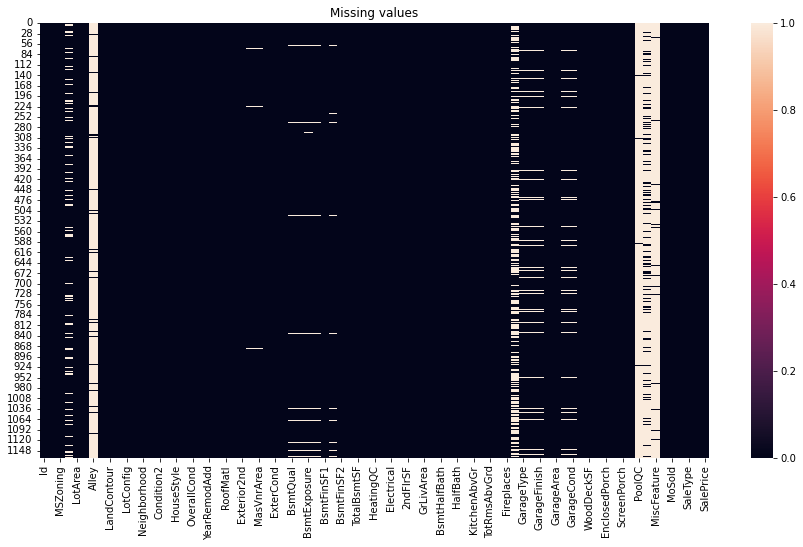

In [14]:
print(df.isnull().sum())
plt.figure(figsize=[15,8])
sns.heatmap(df.isnull())
plt.title("Missing values")

Dataset have too many missing values within. We will be curing it as per the nature variable is holding with the target variable.

In [15]:
### Dropping the variables that have majority of the null values here. 
df.drop(['MiscFeature','PoolQC','Fence','FireplaceQu','Alley','Id'],inplace=True,axis=1)

In [16]:
### Now replacing and filling in the null values with mode, mean of their respective distribution. 
df['BsmtQual'].fillna(df['BsmtQual'].mode()[0].strip(),inplace=True)
df['BsmtCond'].fillna(df['BsmtCond'].mode()[0].strip(),inplace=True)
df['BsmtExposure'].fillna(df['BsmtExposure'].mode()[0].strip(),inplace=True)
df['BsmtFinType1'].fillna(df['BsmtFinType1'].mode()[0].strip(),inplace=True)
df['BsmtFinType2'].fillna(df['BsmtFinType2'].mode()[0].strip(),inplace=True)
df['GarageType'].fillna(df['GarageType'].mode()[0].strip(),inplace=True)
df['GarageFinish'].fillna(df['GarageFinish'].mode()[0].strip(),inplace=True)
df['GarageQual'].fillna(df['GarageQual'].mode()[0].strip(),inplace=True)
df['GarageCond'].fillna(df['GarageCond'].mode()[0].strip(),inplace=True)
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)
df['GarageYrBlt'].fillna(df['GarageYrBlt'].median(),inplace=True)
df['MasVnrArea'].fillna(df['MasVnrArea'].median(),inplace=True)
print("All null values are now taken care of, either filled or dropped as per the significance it has with target variable.")

All null values are now taken care of, either filled or dropped as per the significance it has with target variable.


Text(0.5, 1.0, 'Missing values')

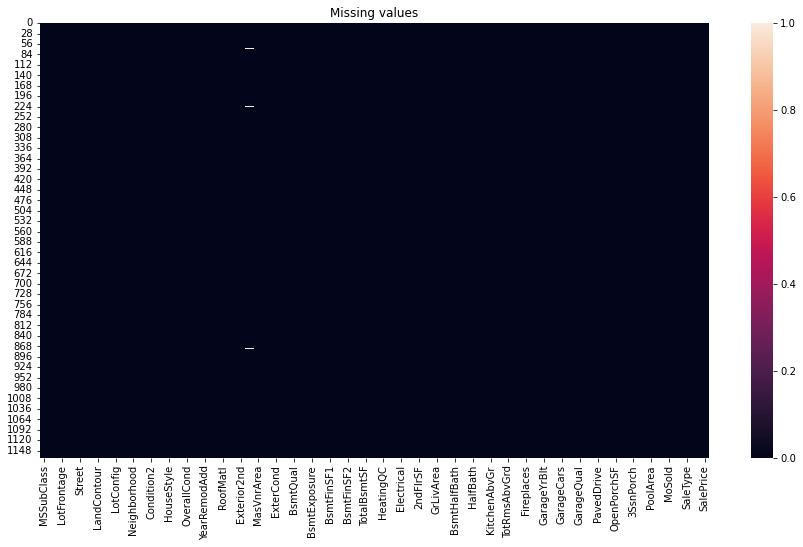

In [17]:
plt.figure(figsize=[15,8])
sns.heatmap(df.isnull())
plt.title("Missing values")

               MSSubClass  LotFrontage   LotArea  OverallQual  OverallCond  \
MSSubClass       1.000000    -0.336234 -0.124151     0.070462    -0.056978   
LotFrontage     -0.336234     1.000000  0.296790     0.229981    -0.047851   
LotArea         -0.124151     0.296790  1.000000     0.107188     0.017513   
OverallQual      0.070462     0.229981  0.107188     1.000000    -0.083167   
OverallCond     -0.056978    -0.047851  0.017513    -0.083167     1.000000   
YearBuilt        0.023988     0.112000  0.005506     0.575800    -0.377731   
YearRemodAdd     0.056618     0.089513  0.027228     0.555945     0.080669   
MasVnrArea       0.028215     0.188273  0.120192     0.403985    -0.135133   
BsmtFinSF1      -0.052236     0.227732  0.221851     0.219643    -0.028810   
BsmtFinSF2      -0.062403     0.001253  0.056656    -0.040893     0.044336   
BsmtUnfSF       -0.134170     0.115628  0.006600     0.308676    -0.146384   
TotalBsmtSF     -0.214042     0.356180  0.259733     0.528285   

<AxesSubplot:>

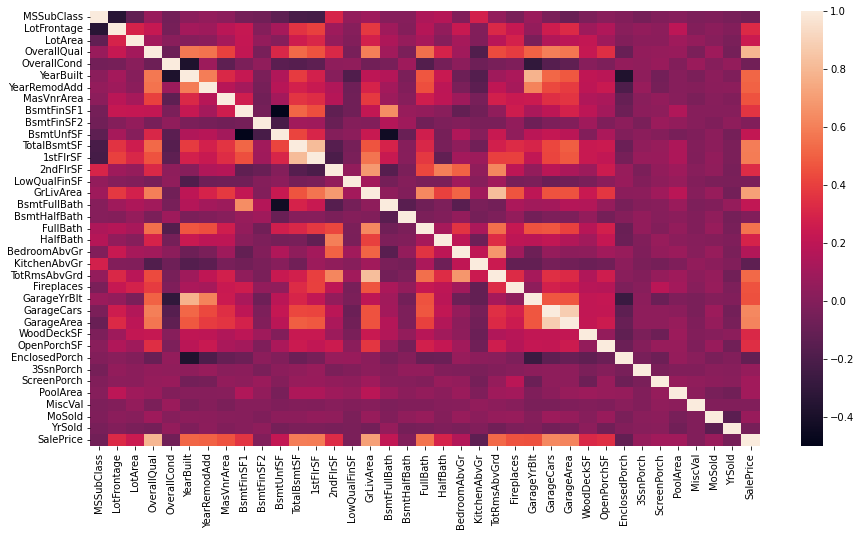

In [31]:
print(df.corr())
plt.figure(figsize=[15,8])
sns.heatmap(df.corr())

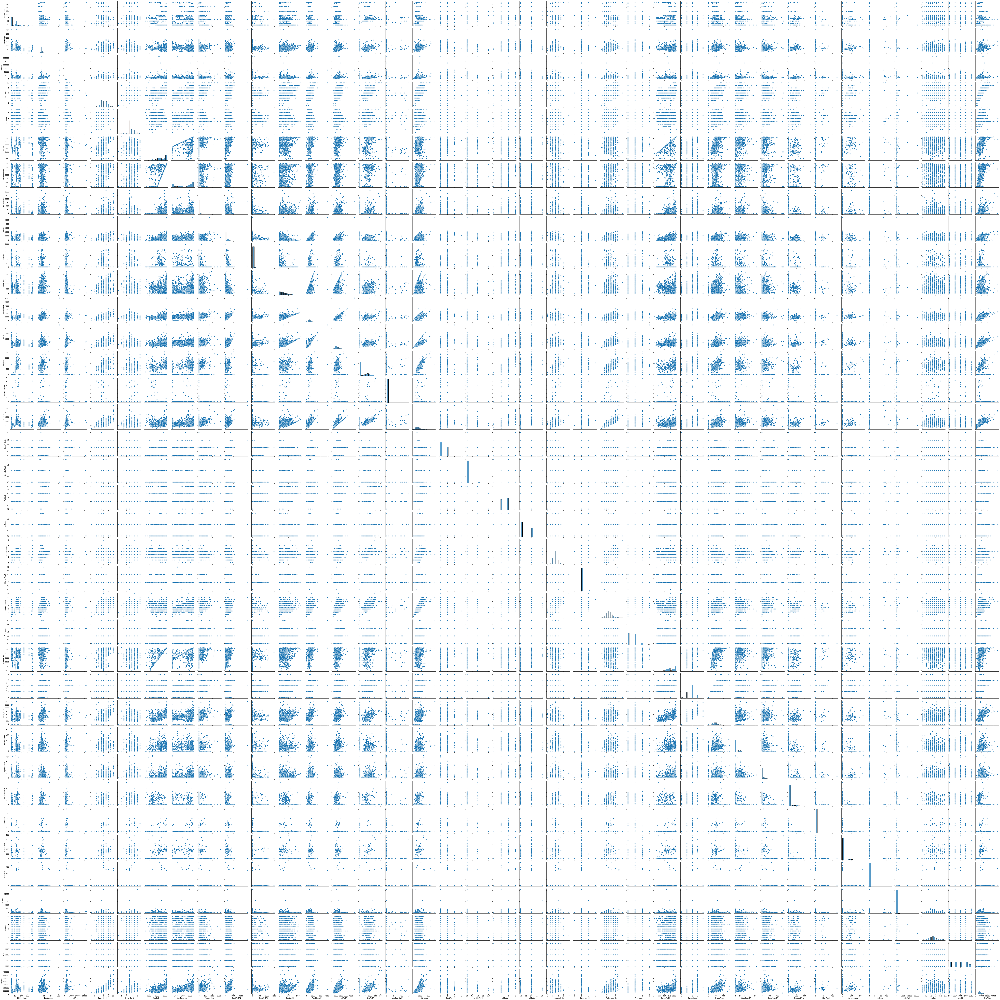

In [24]:
sns.pairplot(df)

In [19]:
### Segreating the categorical and continous variables here.
categorical_columns = ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig','LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1','BsmtFinType2',  'Heating','HeatingQC', 'CentralAir', 'Electrical',  'KitchenQual',
        'Functional',  'GarageType','GarageFinish', 'GarageQual','GarageCond', 'PavedDrive',  'SaleType',
       'SaleCondition']

In [20]:
list = list(df.columns)
continous_columns=[]
for i in list:
    if(i not in categorical_columns):
        continous_columns.append(i)

In [21]:
print(continous_columns)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


In [22]:
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


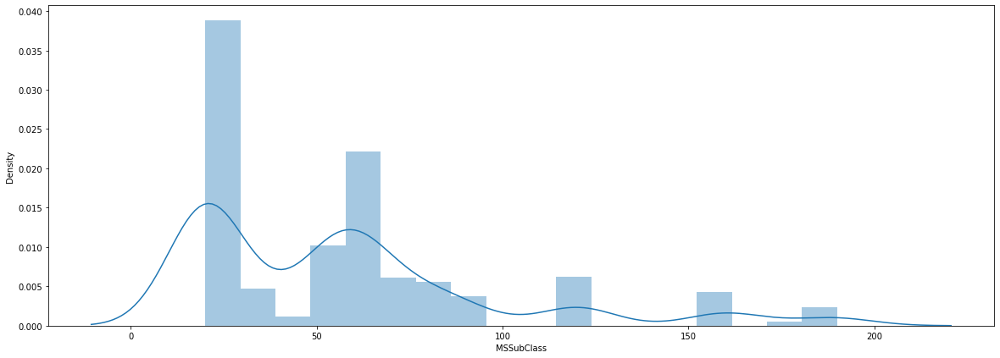

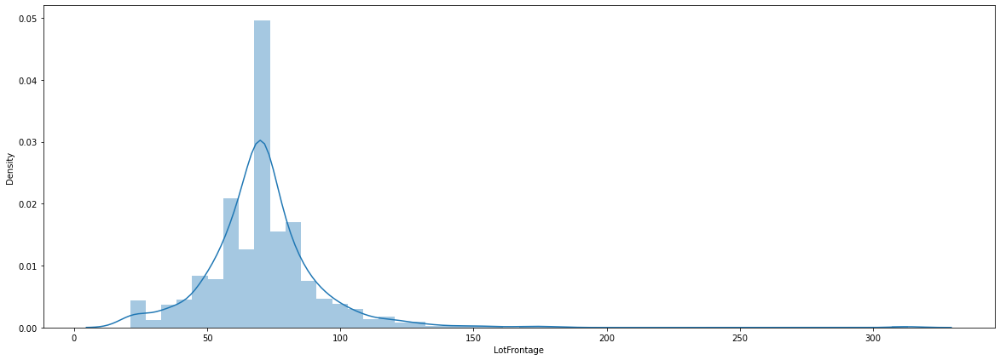

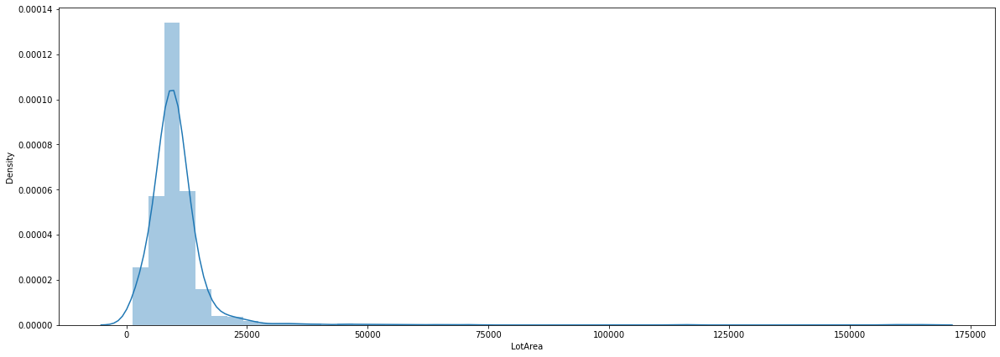

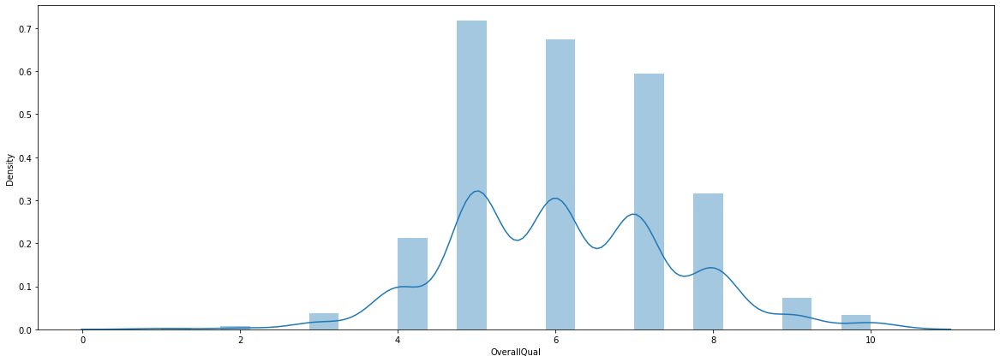

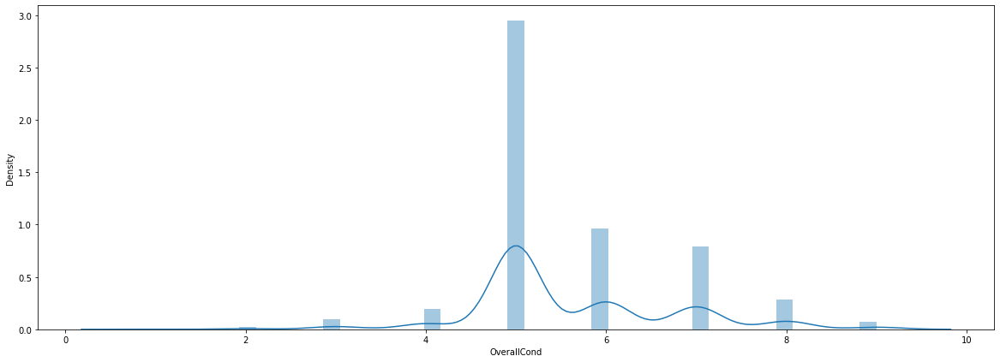

...

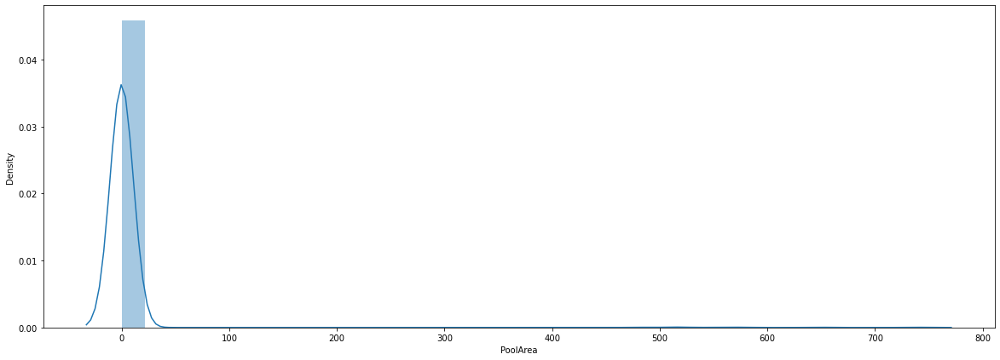

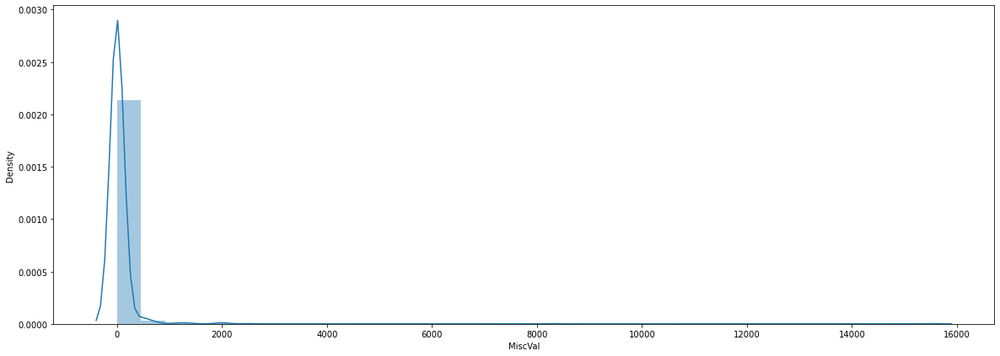

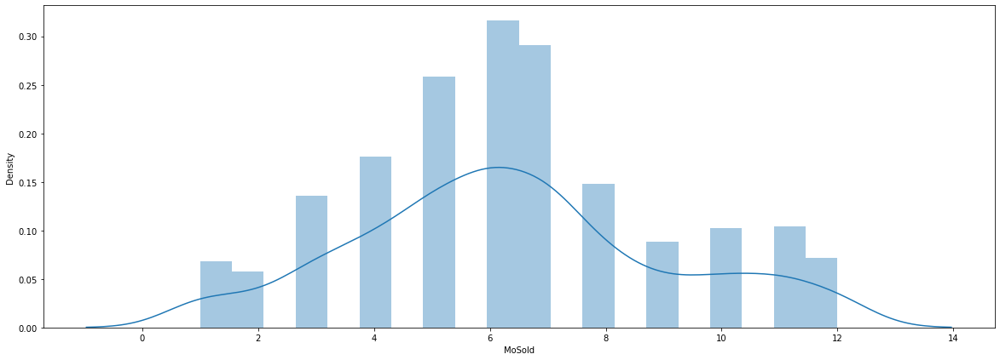

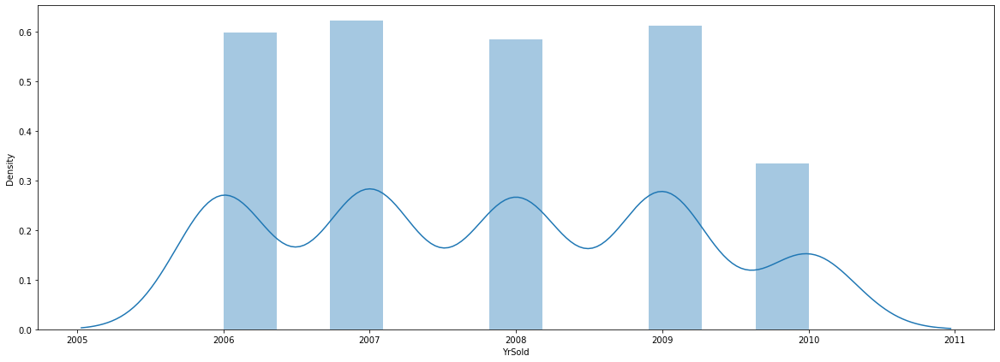

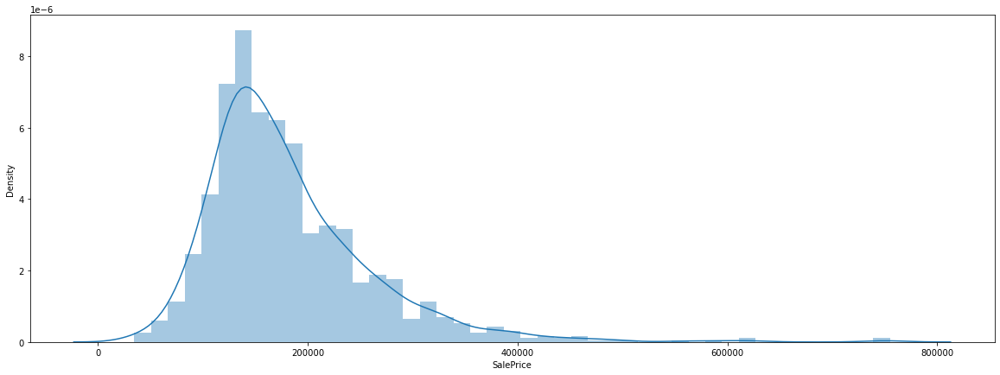

In [23]:
count=1;
for i in range(0,len(continous_columns)):
        plt.figure(figsize=(20,500))
        plt.subplot(60,1,count)
        count=count+1
        sns.distplot(df[continous_columns[i]])
        plt.show()

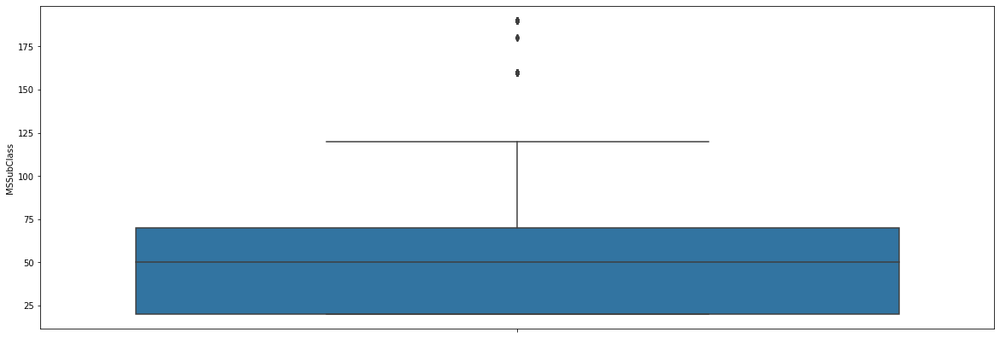

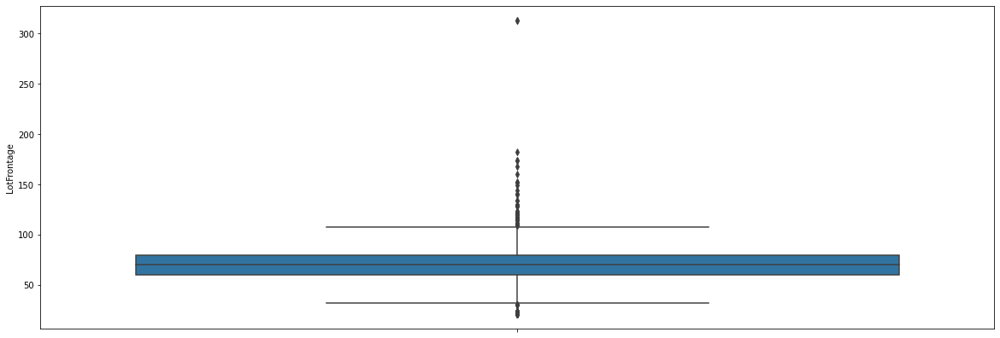

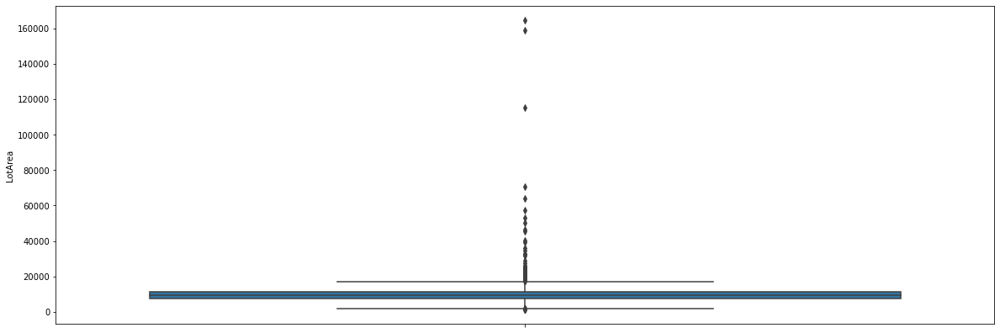

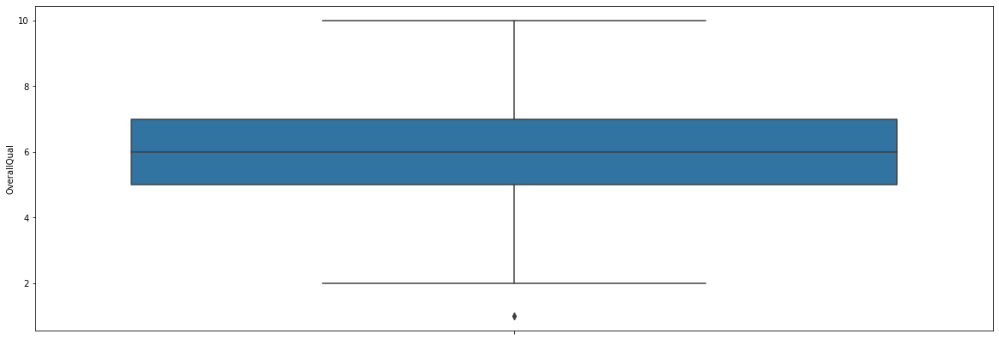

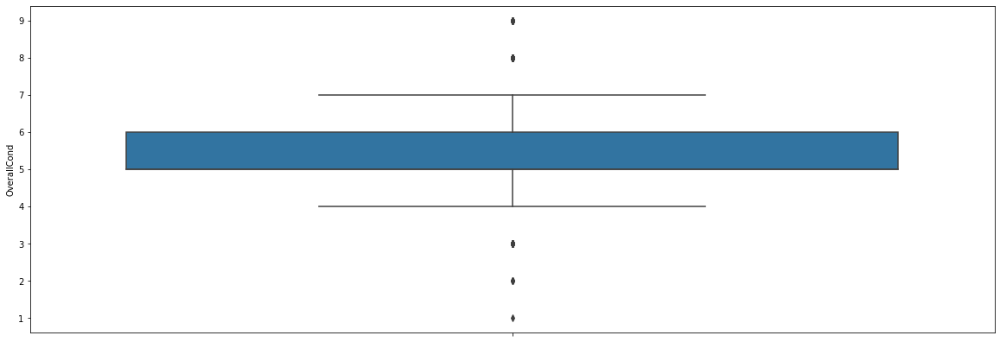

...

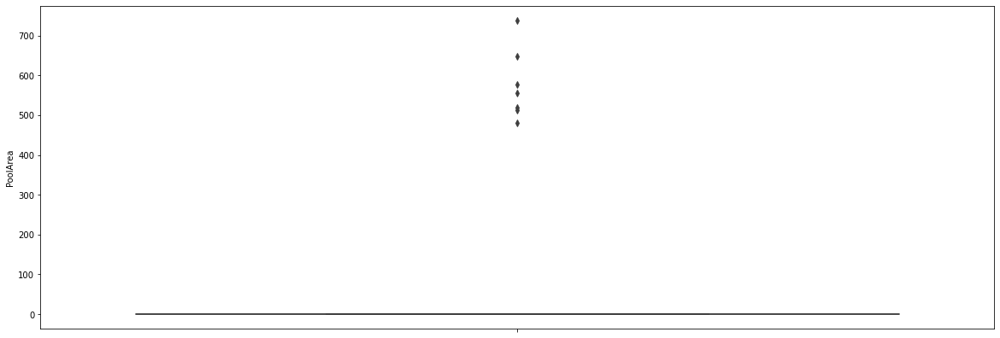

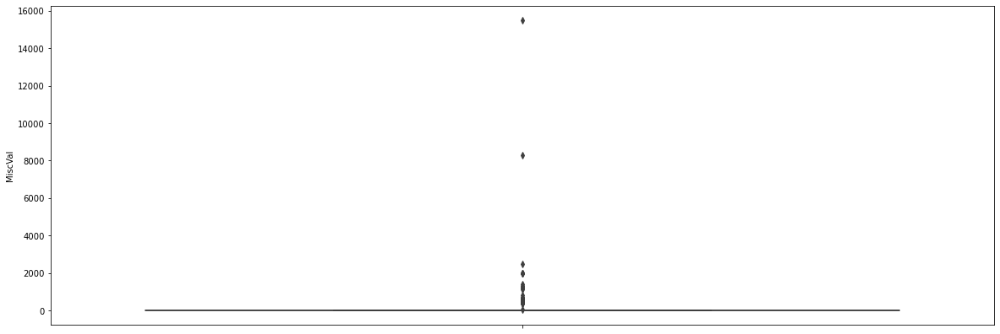

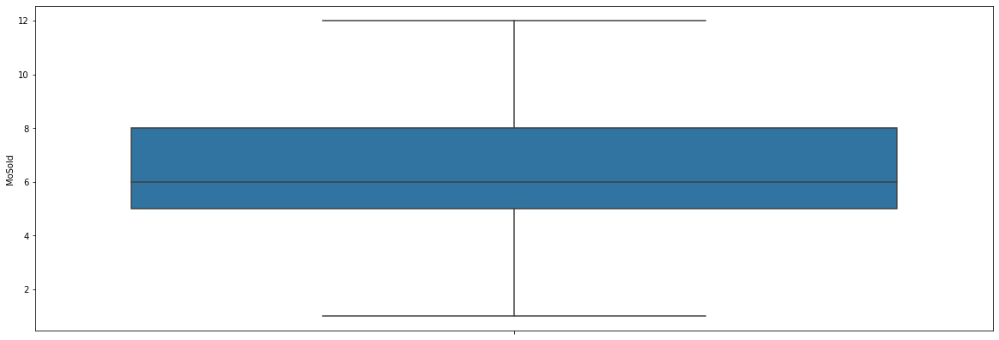

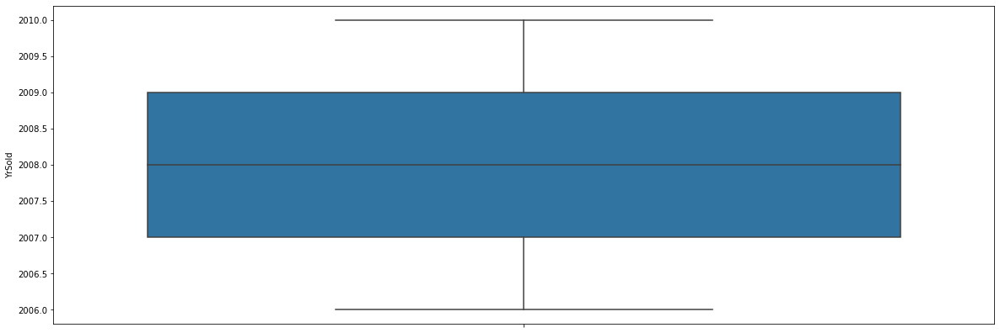

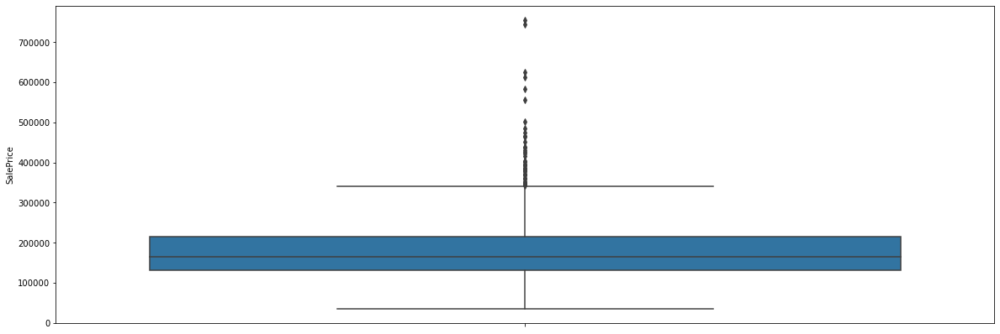

In [25]:
count=1;
for i in range(0,len(continous_columns)):
        plt.figure(figsize=(20,500))
        plt.subplot(60,1,count)
        sns.boxplot(y=continous_columns[i],hue = continous_columns[i],data=df)
        plt.show()

Continous variables are not holding the normal distribution, in addition, they do have the outliers as well. It will make the training of the model more complicated, we will remove the skeweness and outliers moving ahead.

<AxesSubplot:xlabel='SalePrice', ylabel='LotArea'>

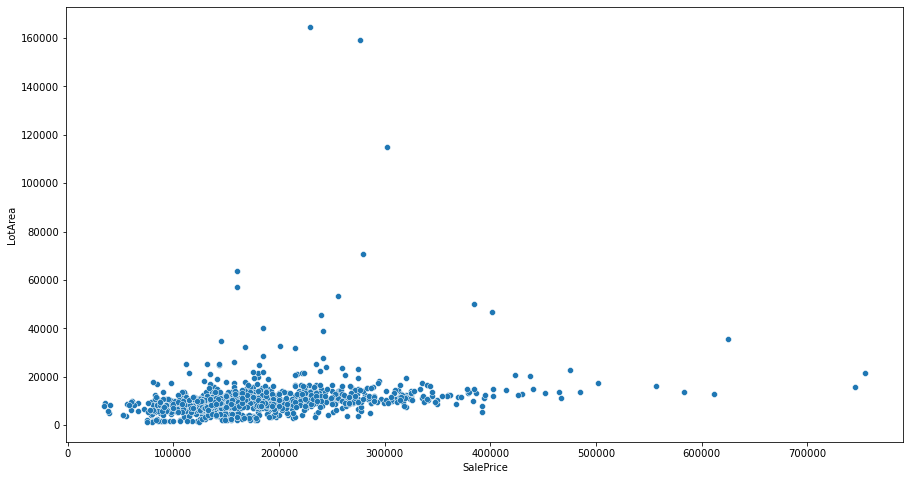

In [26]:
### Looking at the individual target variable's distribution now. 
plt.figure(figsize=[15,8])
sns.scatterplot(x='SalePrice',y='LotArea',data=df)

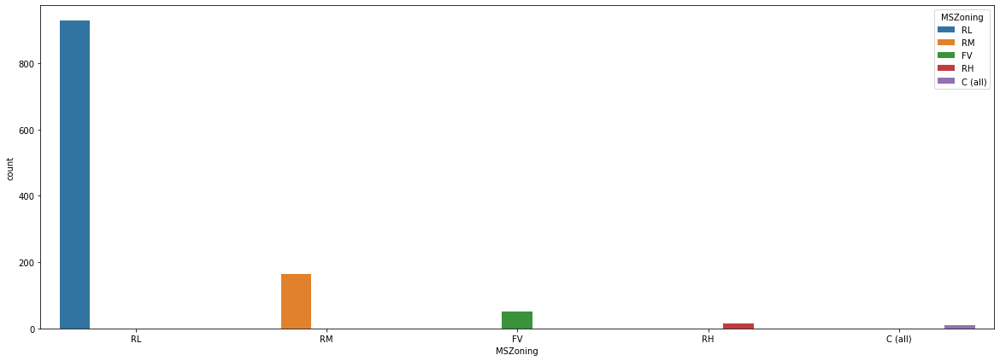

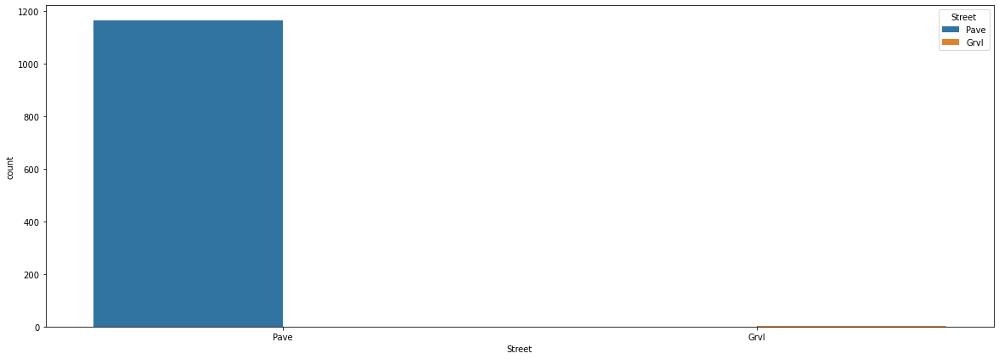

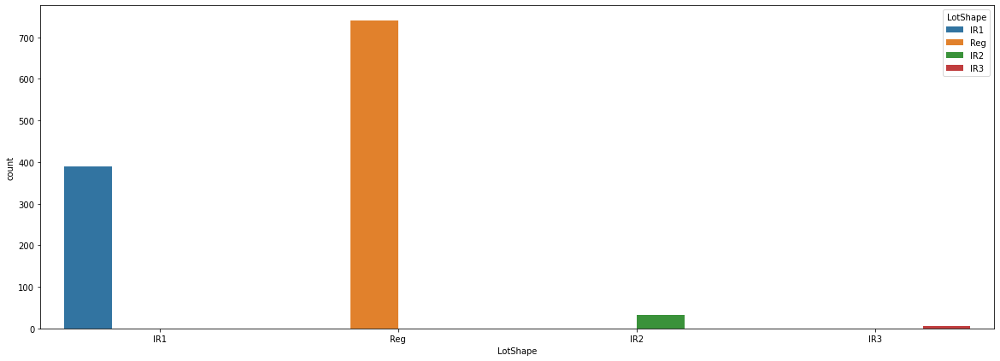

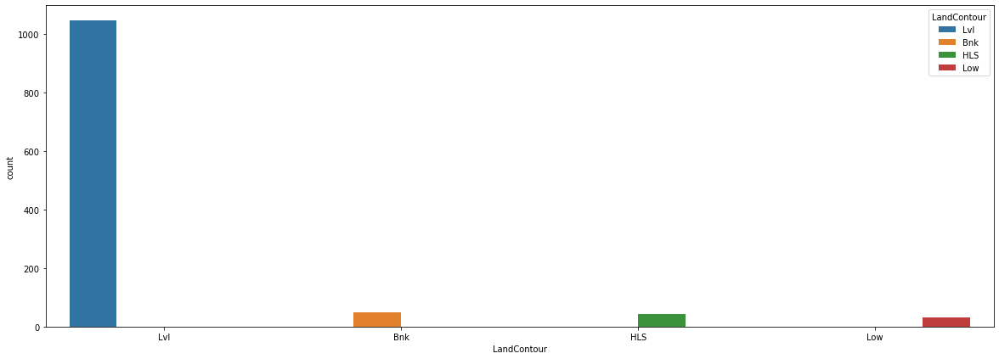

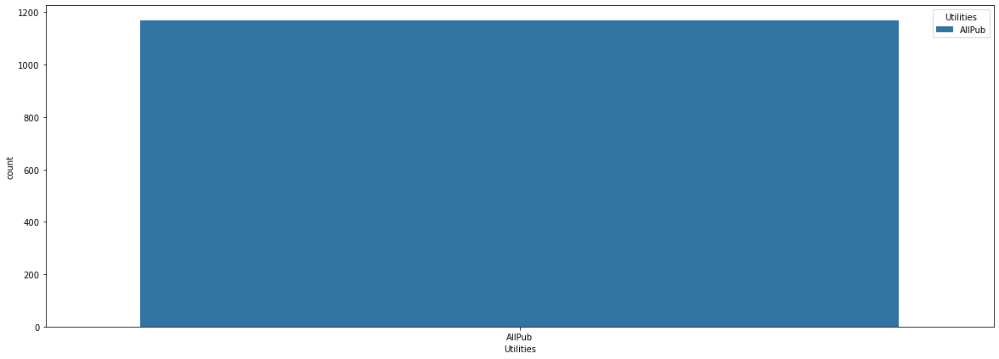

...

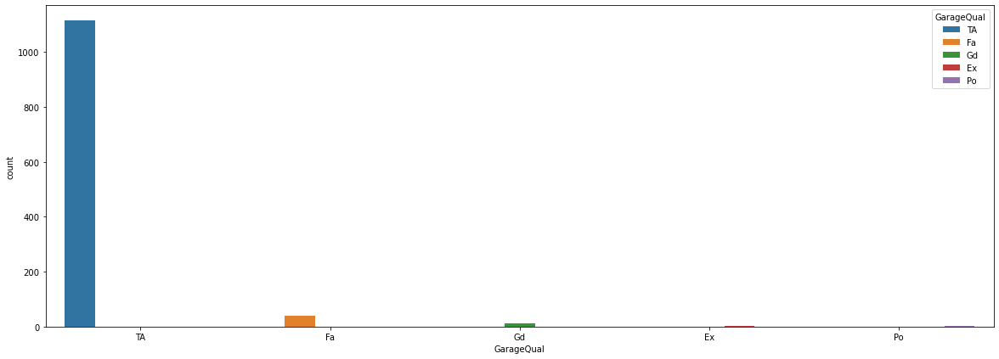

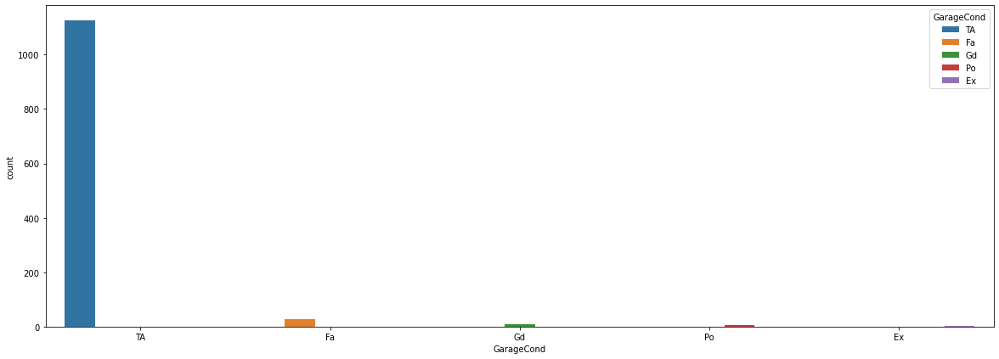

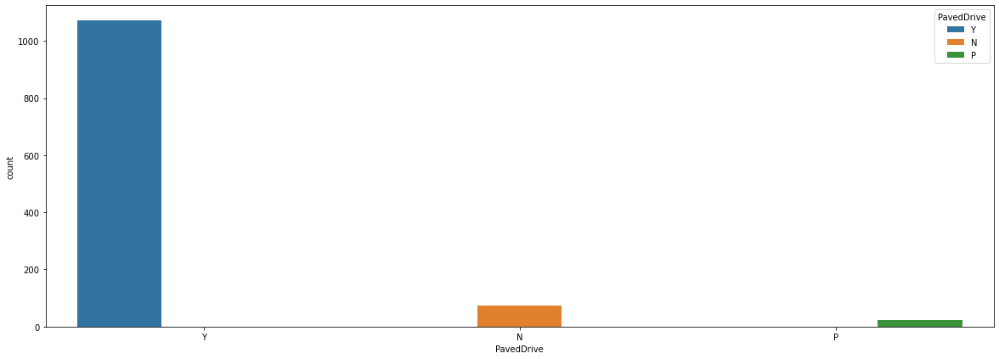

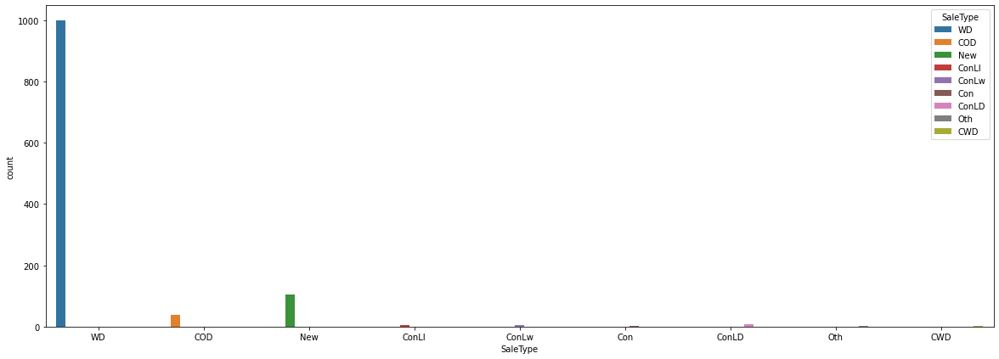

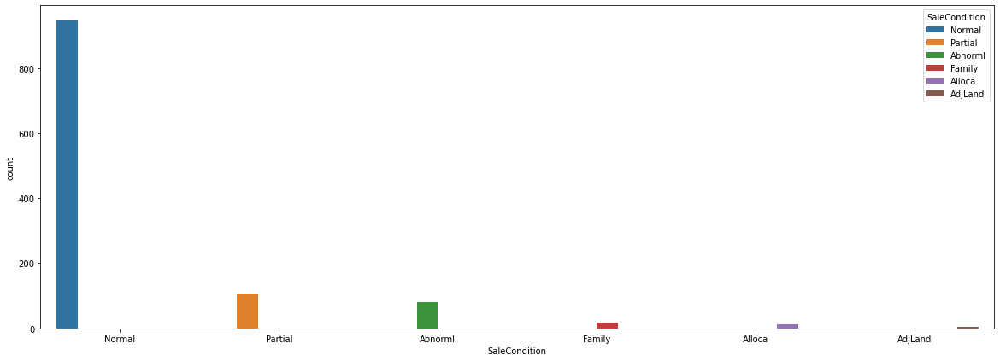

In [27]:
count=1;
for column in categorical_columns:
        plt.figure(figsize=(20,500))
        plt.subplot(60,1,count)
        count=count+1
        sns.countplot(x=column,hue=column,data=df)
        plt.show()

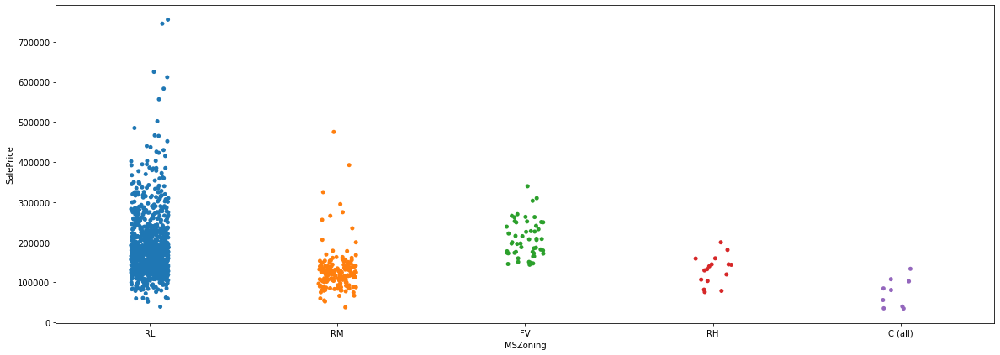

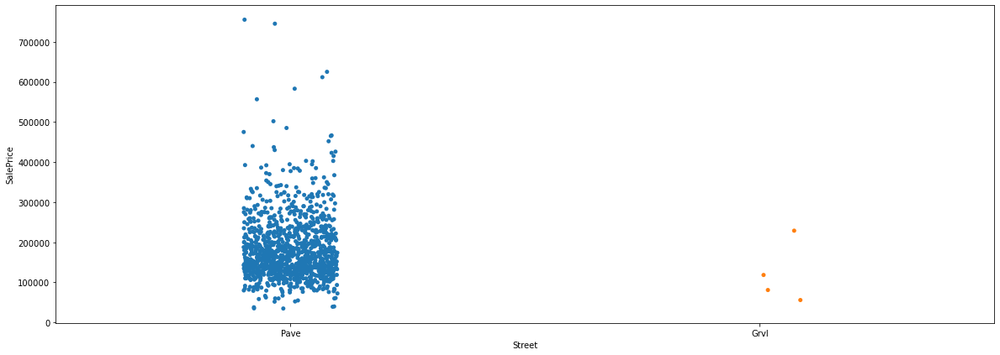

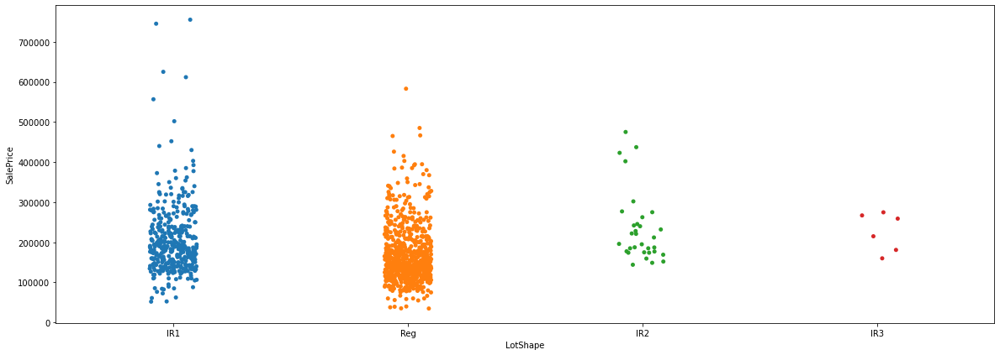

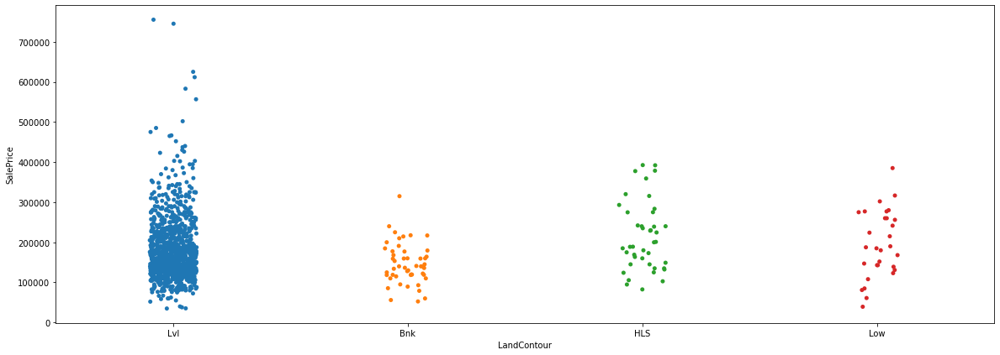

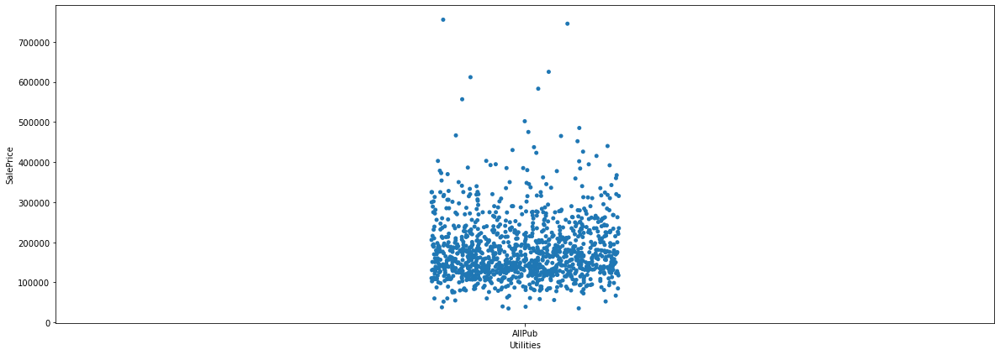

...

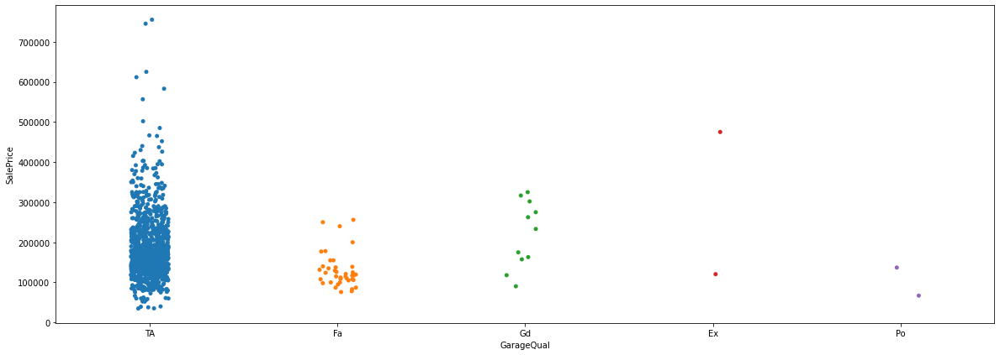

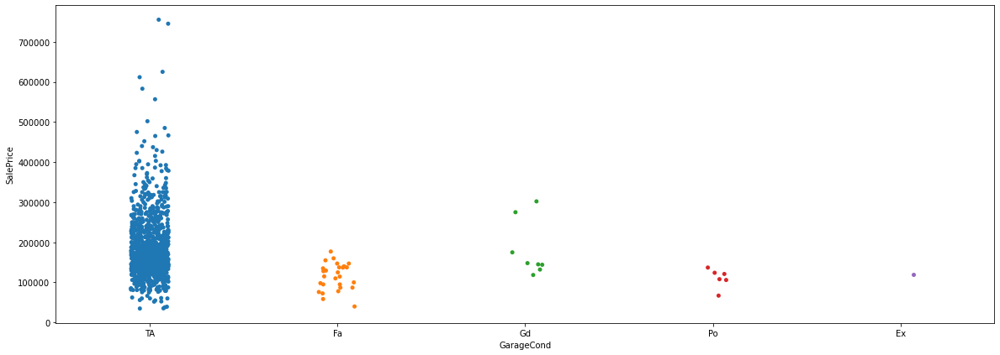

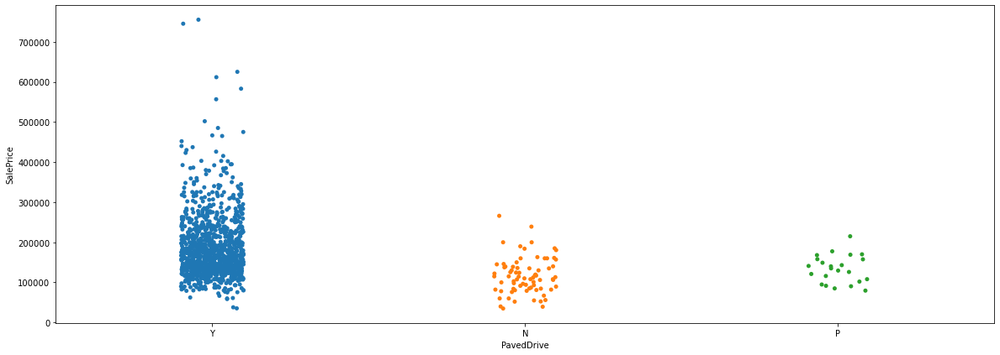

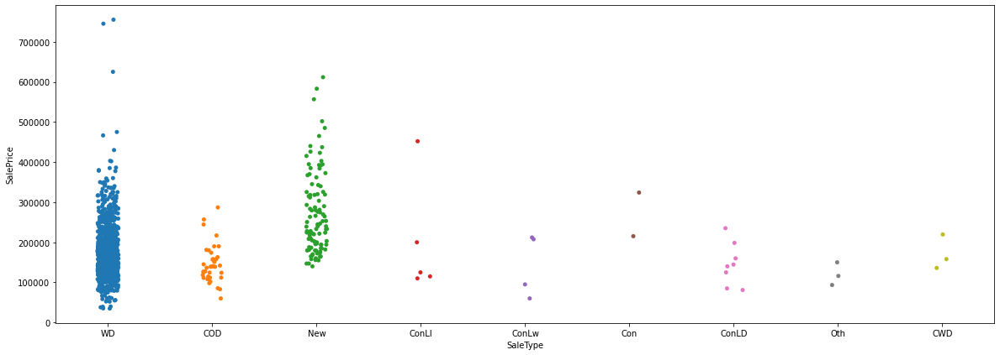

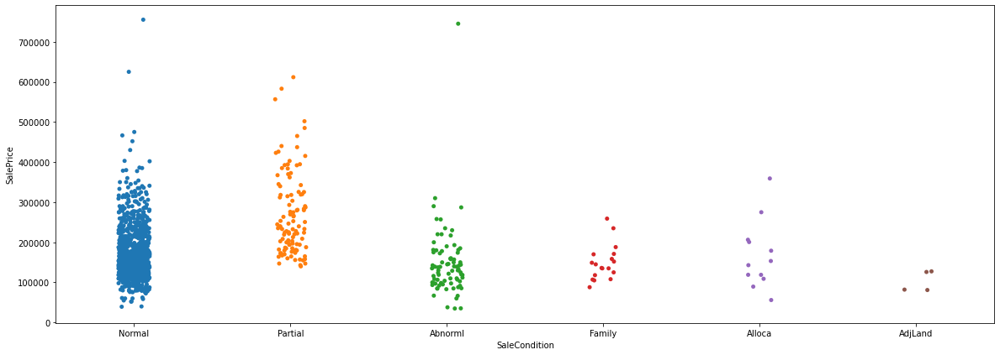

In [32]:
### Looking at the individual categorical variable and significance it holds with target variable.
count=1;
for column in categorical_columns:
        plt.figure(figsize=(20,500))
        plt.subplot(60,1,count)
        count=count+1
        sns.stripplot(x=column, y="SalePrice", data=df)
        plt.show()

Observations:
    
#### Each individual categorical varaible specific value holds high significance with the target varaible "SalePrice". This is as follows: 
    
    - With RL zoning the property have higher value 
    - With Pave stype property have higher value
    - IR1 shape property have higher value
    - LVL property have higher value
    - Corner property have higher value
    - Gentle slope property have higher value
    - NoRidge property have higher value
    - Norm property have higher value
    - Nrm property have higher value
    - 1Fam property have higher value
    - 2 story property have higher value
    - Gable and Hip stype property have higher value
    - Compshg and WdShngle type property have higher value
    - Brkcomm, Aspshnn style decreases the property value
    - Hd board type property have higher value
    - BrkCmn type decreases the property value
    - Gd and Ex quality have higher property value
    - Pconc foundation property have higher value
    - Ex quality property have higher value
    - Po quality property have low price 
    - GLQ type have higher property prices
    - Unf type have higher price
    - GasA heating system have higher property price
    - Houses with Fa HeatingQc price is low 
    - Houses with central air have higher cost
    - houses with FuseP and Mix have lower property value
    - Excelent kitchen quality can increase the Property value
    - Attached garage have higher property value
    - Poor garage quality decreases the price of property
    - Paved drive hiuses have higher price
    - WD and New sale type can get higher price
    - having AdjLand have lower price

In [33]:
### Label  Encoding the variables now. 

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in categorical_columns:
    df[col] =  le.fit_transform(df[col])

In [35]:
### Removing the outliers from the dataset. 

for i in continous_columns:
    IQR = df[i].quantile(0.75)-df[i].quantile(0.25)
    bmax =  df[i].quantile(0.75) + 1.5*IQR
    bmin =  df[i].quantile(0.25) - 1.5*IQR
    df.loc[df[i]>bmax,i] = bmax
    df.loc[df[i]<bmin,i] = bmin

In [36]:
### Performing the MinMax Scaling 
from sklearn.preprocessing import MinMaxScaler

final  = df.drop(categorical_columns,axis=1)
final = final.drop('SalePrice',axis=1)
scale = MinMaxScaler()
minmax = scale.fit_transform(final)
final = pd.DataFrame(minmax, columns = final.columns)

In [38]:
### Bringing the target variable in the scaled dataframe.
final_new = power_transform(final)
final_new = pd.DataFrame(final_new,columns=final.columns)
final_new= final_new.join(df['SalePrice'])
for i in categorical_columns:
    final_new=final_new.join(df[i])

### Splitting the dataset: 

In [39]:
x = final_new.drop('SalePrice',axis=1)
y = final_new['SalePrice']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=33)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(817, 74)
(351, 74)
(817,)
(351,)


### Building the model now: 

In [40]:
lr = LinearRegression()
lr.fit(x_train, y_train)
pred = lr.predict(x_test)
print('R2 score',r2_score(y_test, pred))
print('MAE:', mean_absolute_error(y_test, pred))
print('MSE:', mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, pred)))

R2 score 0.9122522295050699
MAE: 14889.955766381772
MSE: 371736028.123931
RMSE: 19280.45715547043


In [41]:
rr = Ridge(alpha=0.01)
rr.fit(x_train, y_train) 
pred = rr.predict(x_test)
print('R2 score',r2_score(y_test, pred))
print('MAE:', mean_absolute_error(y_test, pred))
print('MSE:', mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, pred)))

R2 score 0.911823459114965
MAE: 14934.890606094272
MSE: 373552477.7145672
RMSE: 19327.505729259716


In [42]:
lasso = Lasso(alpha=0.01)
lasso.fit(x_train, y_train) 
pred = lasso.predict(x_test)
print('R2 score',r2_score(y_test, pred))
print('MAE:', mean_absolute_error(y_test, pred))
print('MSE:', mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, pred)))

R2 score 0.9118234658159894
MAE: 14935.104867786691
MSE: 373552449.3262428
RMSE: 19327.504994857532


In [43]:
enet = ElasticNet(alpha = 0.01)
enet.fit(x_train, y_train) 
pred = enet.predict(x_test)
print('R2 score',r2_score(y_test, pred))
print('MAE:', mean_absolute_error(y_test, pred))
print('MSE:', mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, pred)))

R2 score 0.9119966779517421
MAE: 14928.021981156287
MSE: 372818650.72367525
RMSE: 19308.512390230255


In [44]:
from sklearn.tree import DecisionTreeRegressor

In [45]:
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred = dtr.predict(x_test)
print('R2 score', r2_score(y_test, pred))
print('MAE:', mean_absolute_error(y_test, pred))
print('MSE:', mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, pred)))

R2 score 0.7717072567318615
MAE: 23041.418803418805
MSE: 967142950.2236468
RMSE: 31098.922010636426


In [46]:
from sklearn.ensemble import RandomForestRegressor
rdr = RandomForestRegressor()
rdr.fit(x_train,y_train)
pred1=rdr.predict(x_test)
print('R2 score',r2_score(y_test, pred1))
print('MAE:', mean_absolute_error(y_test, pred1))
print('MSE:', mean_squared_error(y_test, pred1))
print('RMSE:', np.sqrt(mean_squared_error(y_test,pred1)))

R2 score 0.8903397061885381
MAE: 15678.91819088319
MSE: 464566584.8197414
RMSE: 21553.80673616012


### Performing the cross validation score on the basis of R2 Score models got: 

In [47]:
print("Cross validation score of Linear Regression:",cross_val_score(lr,x,y,cv=5).mean())
print("Cross validation score of Ridge Regressor:",cross_val_score(rr,x,y,cv=5).mean())
print("Cross validation score of Lasso Regressor:",cross_val_score(lasso,x,y,cv=5).mean())
print("Cross validation score of ElasticNet Regressor:",cross_val_score(enet,x,y,cv=5).mean())
print("Cross validation score fo Decision Tree Regressor:",cross_val_score(dtr,x,y,cv=5).mean())
print("Cross validation score of Random Forest Regressor:",cross_val_score(rdr,x,y,cv=5).mean())

Cross validation score of Linear Regression: 0.8588006444728107
Cross validation score of Ridge Regressor: 0.8596712295672658
Cross validation score of Lasso Regressor: 0.8595843302432258
Cross validation score of ElasticNet Regressor: 0.8639115938544559
Cross validation score fo Decision Tree Regressor: 0.7265022690708568
Cross validation score of Random Forest Regressor: 0.8828788141266127


    Random Forest Regressor is giving the highest cross score in comparison to other model instances. We will be hyper-parameter tuning the variables now and check the model again.

### Performing hyper parameter tuning: 

In [48]:
from sklearn.model_selection import GridSearchCV
parameter = {
 'max_depth': [100, 400, 800,1200],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5],
 'n_estimators': [100,200, 400, 800]
}
GCV = GridSearchCV(RandomForestRegressor(),parameter,cv=5)

In [49]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [100, 400, 800, 1200],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400, 800]})

In [50]:
GCV.best_params_

{'max_depth': 800,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [52]:
rdr = RandomForestRegressor(max_depth= 400,
min_samples_leaf= 1,
min_samples_split= 2,
n_estimators= 100)
rdr.fit(x_train,y_train)
pred1=rdr.predict(x_test)
print('R2 score',r2_score(y_test, pred1))
print('MAE:', mean_absolute_error(y_test, pred1))
print('MSE:', mean_squared_error(y_test, pred1))
print('RMSE:', np.sqrt(mean_squared_error(y_test,pred1)))

R2 score 0.8861992420212079
MAE: 16127.335327635328
MSE: 482107312.01396364
RMSE: 21956.94222823305


### Testing the model now: 

In [54]:
### Importing the dataset to predict on the basis of Random Forest Regressor model.
df1 = pd.read_csv("housingtest.csv")

In [55]:
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


In [56]:
df1.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
                 ..
MiscVal           0
MoSold            0
YrSold            0
SaleType          0
SaleCondition     0
Length: 80, dtype: int64

In [57]:
### Since the dataset do have the missing values, we will fill in them with either mode or mean values.
df1['BsmtQual'].fillna(df1['BsmtQual'].mode()[0].strip(),inplace=True)
df1['BsmtCond'].fillna(df1['BsmtCond'].mode()[0].strip(),inplace=True)
df1['BsmtExposure'].fillna(df1['BsmtExposure'].mode()[0].strip(),inplace=True)
df1['BsmtFinType1'].fillna(df1['BsmtFinType1'].mode()[0].strip(),inplace=True)
df1['BsmtFinType2'].fillna(df1['BsmtFinType2'].mode()[0].strip(),inplace=True)
df1['GarageType'].fillna(df1['GarageType'].mode()[0].strip(),inplace=True)
df1['GarageFinish'].fillna(df1['GarageFinish'].mode()[0].strip(),inplace=True)
df1['GarageQual'].fillna(df1['GarageQual'].mode()[0].strip(),inplace=True)
df1['GarageCond'].fillna(df1['GarageCond'].mode()[0].strip(),inplace=True)
df1['LotFrontage'].fillna(df1['LotFrontage'].median(),inplace=True)
df1['GarageYrBlt'].fillna(df1['GarageYrBlt'].median(),inplace=True)
df1['MasVnrArea'].fillna(df1['MasVnrArea'].median(),inplace=True)

In [58]:
### Dropping the insignificant variables now.
df1.drop(['MiscFeature','PoolQC','Fence','FireplaceQu','Alley','Id'],inplace=True,axis=1)

In [59]:
### Changing the categorical variable into continous variable.
LE = LabelEncoder()
for col in categorical_columns:
    df1[col] =  LE.fit_transform(df1[col])

In [60]:
### Removing outliers and skewness from the dataset.
for i in continous_columns[:len(continous_columns)-1]:
    IQR = df1[i].quantile(0.75)-df1[i].quantile(0.25)
    bmax =  df1[i].quantile(0.75) + 1.5*IQR
    bmin =  df1[i].quantile(0.25) - 1.5*IQR
    df1.loc[df1[i]>bmax,i] = bmax
    df1.loc[df1[i]<bmin,i] = bmin

In [61]:
final  = df1.drop(categorical_columns,axis=1)
scale = MinMaxScaler()
minmax = scale.fit_transform(final)
final = pd.DataFrame(minmax, columns = final.columns)

In [62]:
final_new = power_transform(final)
final_new = pd.DataFrame(final_new,columns=final.columns)

In [63]:
for i in categorical_columns:
    final_new=final_new.join(df[i])

In [64]:
pred=rdr.predict(final_new)

In [65]:
prediction_housing = pd.DataFrame({'SalePrice': pred})
prediction_housing

,SalePrice
0,311951.640
1,217929.480
2,275979.215
3,167524.150
4,194134.240
...,...
287,258750.975
288,136423.210
289,137982.700
290,141277.300


In [66]:
### Saving the model now. 
prediction_housing.to_excel("Price_prediction.xlsx")

In [67]:
import joblib
joblib.dump(rdr,"Housing Price Prediction Project.pkl")

['Housing Price Prediction Project.pkl']

The End.